In [ ]:
pip install camel-tools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 114 kB 4.7 MB/s 
     |████████████████████████████████| 197 kB 39.8 MB/s 
     |████████████████████████████████| 418 kB 39.2 MB/s 
     |████████████████████████████████| 4.7 MB 22.9 MB/s 
     |████████████████████████████████| 6.6 MB 45.7 MB/s 
     |████████████████████████████████| 101 kB 9.5 MB/s 
  Created wheel for camel-kenlm: filename=camel_kenlm-2021.12.27-cp37-cp37m-linux_x86_64.whl size=2335610 sha256=006b94b04f2af60a62d39e64ad1f0cf1ae372d045a1cd583b9e4f1578f364c0e
  Stored in directory: /root/.cache/pip/wheels/db/72/74/982f8c435f15b7feaf6dc8a03e212ff34e93f1f2d747059332
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13723 sha256=6af015b129951c4502fd8b2b050abd10e4b1d97a7c5a366f121e00640affb57c
  Stored in directory: /root/.cache/pip/wheels/72/b0/3f/1d95f96ff986c7dfffe46ce2be4062f38ebd04b506c77c81b9
  Created

In [ ]:
pip install tnkeeh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 365 kB 5.2 MB/s 
     |████████████████████████████████| 212 kB 59.5 MB/s 
     |████████████████████████████████| 115 kB 44.8 MB/s 
     |████████████████████████████████| 127 kB 60.6 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


In [ ]:
pip install arabic-stopwords

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 353 kB 5.4 MB/s 
     |████████████████████████████████| 126 kB 64.9 MB/s 


In [ ]:
pip install lime==0.2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 5.1 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=7257c4c7ef1f08e734198186d4010dae23e3cef8586109a49ec61e1b542d143e
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**implementations needed for this project**

In [ ]:
import pandas as pd
import nltk
import string
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix,accuracy_score, classification_report
from sklearn.svm import SVC
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split, GridSearchCV
import arabicstopwords.arabicstopwords as ast
from tnkeeh import tnkeeh
from sklearn.svm import SVC  
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from sklearn.linear_model import Ridge, lars_path
from lime.lime_text import explanation
from functools import partial
import scipy as sp
import random
from sklearn.utils import check_random_state
from camel_tools.tokenizers.word import simple_word_tokenize
from nltk.stem.snowball import SnowballStemmer
import seaborn as sns
import torch
from transformers.file_utils import is_tf_available, is_torch_available, is_torch_tpu_available
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from transformers import Trainer, TrainingArguments
from sklearn.metrics import accuracy_score

**upload dataset**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving NileUniversity_Emotional.csv to NileUniversity_Emotional.csv


**Reading Data**

In [ ]:
df=pd.read_csv("NileUniversity_Emotional.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10065 entries, 0 to 10064
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   ID      10065 non-null  int64 
 1   text    10064 non-null  object
 2   label   10065 non-null  object
dtypes: int64(1), object(2)
memory usage: 236.0+ KB


check null values 

In [ ]:
df.isnull().sum()

ID       0
text     1
label    0
dtype: int64

remove null values

In [ ]:
df = df.dropna()
df.isnull().sum()

ID       0
text     0
label    0
dtype: int64

check duplicates 

In [ ]:
df.duplicated().sum()

0

**Count of each class**

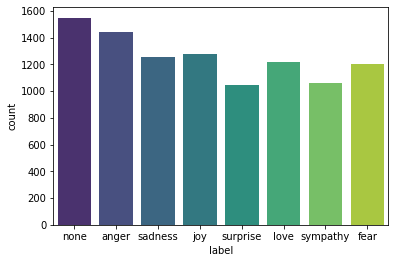

In [ ]:
sns.countplot(x='label', data=df, palette='viridis')

## normalize data 

In [ ]:
def normalizeArabic(text):
    #text = re.sub( "ا","[إأٱآا]" ,str(text))
    text = re.sub("يي", "ي", str(text))
    text = re.sub("اا", "ا", str(text))
    text = re.sub("وو", "و", str(text))
    text = re.sub("ى", "ي", text)
   # text = re.sub("ؤ", "ء", text)
   # text = re.sub("ئ", "ء", text)
    text = re.sub("ة", "ه", text)

    return(text)

In [ ]:
df['text'] = df['text'].apply(normalizeArabic)

**Removing **

*   diacritics
*   links,
*   english letters 
*   numbers
*   repeted characters 

In [ ]:
import tnkeeh as tn

cleander = tn.Tnkeeh(remove_diacritics=True,
                     remove_html_elements=True,
                     remove_twitter_meta=True,
                     remove_links=True,
                     remove_english=True,
                     remove_repeated_chars=True,
                     remove_long_words=True,
                     normalize=True
                     )

df['text'] = df['text'].replace(r'[0-9]','', regex=True)



df = cleander.clean_data_frame(df,'text')


## remove stopwords

In [ ]:
stop_words = ast.stopwords_list()

def remove_stop_words(text):
    return ' '.join(word for word in str(text).split() if word not in stop_words)

df['text'] = df['text'].apply(remove_stop_words)    

**Replace emoji into text**

In [ ]:
x = {
 '❤' : 'قلب أحمر' ,
 '💕': 'قلبان' ,
 '😑': 'وجه بلا تعبير' ,
 '😔': ' حزن' ,
 '❤': 'قلب أحمر' ,
 '❣': ' القلب', 
 '🔴': 'دائرة حمراء' ,
 '😂': 'وجه بدموع الفرح' ,
 '💔': 'قلب مكسور' ,
 '😢': 'وجه باكي' ,
 '😭': 'وجه يبكي بصوت عال' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '😂': ' الفرح' ,
 '💔': 'قلب مكسور' ,
 '❤': 'قلب أحمر' ,
 '😔': 'وجه متأمل' ,
 '🌸': 'أزهار الكرز' ,
 '💙': 'قلب أزرق' ,
 '😁': 'عيون مبتسمة' ,
 '💔': ' قلب مكسور ',
 '🌹': ' وردة ',
 '😔': 'وجه متأمل' ,
 '♥': 'بدلة قلب' ,
 '😓': 'وجه منقط بعرق' ,
 '👏': 'يدا التصفيق' ,
 '💜': 'قلب أرجواني' ,
 '😁': 'وجه بعيون مبتسمة' ,
 '✋': 'يد مرفوعة' ,
 '😴': 'وجه نائم' ,
 '🎤': 'ميكروفون' ,
 '🙄': 'وجه بعيون تدور' ,
 '✌': 'يد النصر' ,
 '♨': 'ينابيع ساخنة' ,
 '✋': 'يد مرفوعة' ,
 '😀': 'وجه مبتسم' ,
 '♥': 'بدلة قلب' ,
 '😩': 'وجه مرهق' ,
 '🤔': 'وجه مفكر' ,
 '♥': 'بدلة قلب' ,
 '✋': 'يد مرفوعة' ,
 '♥': 'بدلة قلب' ,
 '😴': 'وجه نائم' ,
 '🙄': 'وجه بعيون تدور' ,
 '🙌': 'رفع الأيدي' ,
 '✌': 'يد النصر' ,
 '✨': 'بريق' ,
 '👌': 'يد جيدة' ,
 '😩': 'وجه مرهق' ,
 '😜': 'وجه يغمز بلسان' ,
 '👐': 'أيادي مفتوحة' ,
 '💵': 'الأوراق النقدية بالدولار' ,
 '😐': 'وجه محايد' ,
 '👊🏽': 'قبضة قادمة: بشرة بلون معتدل' ,
 '😐': 'وجه محايد' ,
 '😓': 'وجه منقط بعرق' ,
 '🌚': 'وجه القمر الجديد' ,
 '😕': 'وجه مرتبك' ,
 '😔': 'وجه متأمل' ,
 '💜': 'قلب أرجواني' ,
 '☺️': 'وجه مبتسم' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '🤔': 'وجه مفكر' ,
 '😒': 'وجه غير مألوف' ,
 '💛': 'قلب أصفر' ,
 '😀': 'وجه مبتسم' ,
 '✋': 'يد مرفوعة' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '💜': 'قلب أرجواني' ,
 '🤔': 'وجه مفكر' ,
 '👌🏻': 'يد جيدة: بشرة بلون فاتح' ,
 '✋': 'يد مرفوعة' ,
 '👈': 'مؤشر اليد الخلفية يشير إلى اليسار' ,
 '☝': 'مؤشر الفهرس لأعلى' ,
 '✏': 'قلم رصاص' ,
 '😌': 'وجه مرتاح' ,
 '😜': 'وجه يغمز بلسان' ,
 '🤕': 'وجه بضمادة رأس' ,
 '💛': 'قلب أصفر' ,
 '💎': 'حجر كريم' ,
 '💞': 'قلوب دائرية' ,
 '🎵': 'نوتة موسيقية' ,
 '💜': 'قلب أرجواني' ,
 '🙃': 'وجه مقلوب' ,
 '😻': 'قط مبتسم بعيون قلب' ,
 '💪🏽': 'العضلة ذات الرأسين المرنة: بشرة بلون متوسط' ,
 '😌': 'وجه مرتاح' ,
 '😉': 'وجه يغمز' ,
 '‼ ️': 'علامة تعجب مزدوجة' ,
 '😔': 'وجه متأمل' ,
 '😕': 'وجه مرتبك' ,
 '✋': 'يد مرفوعة' ,
 '😔': 'وجه متأمل' ,
 '😕': 'وجه مرتبك' ,
 '✋': 'يد مرفوعة' ,
 '😪': 'وجه نعسان' ,
 '😋': 'وجه يشرب الطعام' ,
 '😅': 'وجه مبتسم متعرق' ,
 '😀': 'وجه مبتسم' ,
 '💜': 'قلب أرجواني' ,
 '💜': 'قلب أرجواني' ,
 '😐': 'وجه محايد' ,
 '💘': 'قلب مع سهم' ,
 '😔': 'وجه متأمل' ,
 '🚶🏽': 'شخص يمشي: بشرة متوسطة اللون' ,
 '🙏': 'دعاء' ,
 '🎵': ' موسيقية' ,
 '🎼': ' موسيقية' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '💃': 'امرأة ترقص' ,
 '😒': 'وجه غير مألوف' ,
 '✊': 'قبضة مرفوعة' ,
 '✨': 'بريق' ,
 '🤔': 'وجه مفكر' ,
 '😓': 'وجه منقط بعرق' ,
 '😎': 'وجه مبتسم بنظارات شمسية' ,
 '⚽': 'كرة القدم' ,
 '😱': 'وجه يصرخ من الخوف' ,
 '😌': 'وجه مرتاح' ,
 '😧': 'وجه حزين' ,
 '😅': 'وجه مبتسم متعرق' ,
 '🙈': 'قرد لا يرى الشر' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '☕': 'مشروب ساخن',
 '😔': 'وجه متأمل' ,
 '🙄': 'وجه بعيون تدور' ,
 '✋': 'يد مرفوعة' ,
 '🕊': 'حمامة' ,
 '😩': 'وجه مرهق' ,
 '✌': 'يد النصر' ,
 '😴': 'وجه نائم' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '😣': 'وجه مثابر' ,
 '😐': 'وجه محايد' ,
 '♥': 'بدلة قلب' ,
 '🎉': 'حفلة موسيقية' ,
 '✋': 'يد مرفوعة' ,
 '😫': 'وجه متعب' ,
 '😀': 'وجه مبتسم' ,
 '😷': 'وجه بقناع طبي' ,
 '🙈': 'قرد لا يرى الشر' ,
 '🎀': 'شريط' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '♥': 'بدلة قلب' ,
 '😳': 'وجه متورد' ,
 '😔': 'وجه متأمل',
 '👇': 'مؤشر اليد الخلفية يشير لأسفل' ,
 '🙄': 'وجه بعيون تدور' ,
 '😔': 'وجه متأمل' ,
 '🐸': 'ضفدع' ,
 '♥': 'بدلة قلب' ,
 '👌': 'يد جيدة' ,
 '💘': 'قلب مع سهم' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '✒': 'المنقار الأسود' ,
 '🙄': 'وجه بعيون تدور' ,
 '🔫': 'مسدس مائي' ,
 '💌': 'رسالة حب' ,
 '💖': 'قلب لامع' ,
 '💛': 'قلب أصفر' ,
 '😑': 'وجه بلا تعبير' ,
 '😟': 'وجه قلق' ,
 '🎷': 'ساكسفون' ,
 '💜': 'قلب أرجواني' ,
 '😔': 'وجه متأمل' ,
 '‼ ️': 'علامة تعجب مزدوجة' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '😩': 'وجه مرهق' ,
 '🌸': 'أزهار الكرز' ,
 '😣': 'وجه مثابر' ,
 '🤗': 'وجه يعانق' ,
 '⚠️': 'تحذير' ,
 '✋': 'يد مرفوعة' ,
 '💜': 'قلب أرجواني' ,
 '✌': 'يد النصر' ,
 '✨': 'بريق' ,
 '👍': 'ممتاز' ,
 '😕': 'وجه مرتبك' ,
 '😔': 'وجه متأمل' ,
 '✌': 'يد النصر' ,
 '✔': 'علامة اختيار' ,
 '💗': 'قلب ينمو' ,
 '🙁': 'وجه عابس قليلاً' ,
 '🐸': 'ضفدع' ,
 '☝': 'مؤشر الفهرس لأعلى' ,
 '😕': 'وجه مرتبك' ,
 '👑': 'تاج' ,
 '☹️': 'وجه عابس' ,
 '😄': 'وجه مبتسم بعيون مبتسمة' ,
 '😔': 'وجه متأمل' ,
 '💛': 'قلب أصفر' ,
 '👌': 'يد جيدة' ,
 '💛': 'قلب أصفر' ,
 '👎': 'رفض' ,
 '👌': 'يد جيدة' ,
 '🎶': 'نوتات موسيقية' ,
 '✋': 'يد مرفوعة' ,
 '✨': 'بريق' ,
 '👎': 'رفض' ,
 '💘': 'قلب مع سهم' ,
 '🙄': 'وجه بعيون تدور' ,
 '🏃': 'شخص يركض' ,
 '💗': 'قلب ينمو' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '😕': 'وجه مرتبك' ,
 '🙄': 'وجه بعيون تدور' ,
 '😔': 'وجه متأمل' ,
 '👌🏻': 'يد جيدة: بشرة بلون فاتح' ,
 '🙄': 'وجه بعيون تدور' ,
 '👍🏻': 'ممتاز: بشرة بلون فاتح' ,
 '✌': 'يد النصر' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '♥': 'بدلة قلب' ,
 '🔥': 'حريق' ,
 '💭': 'بالون الفكر' ,
 '🙄': 'وجه بعيون تدور' ,
 '👊': 'قبضة قادمة' ,
 '😔': 'وجه متأمل' ,
 '♥': 'بدلة قلب' ,
 '✌️': 'يد النصر' ,
 '😫': 'وجه متعب' ,
 '💉': 'حقنة',
  '♥': 'بدلة قلب' ,
 '😕': 'وجه مرتبك' ,
 '👐': 'أيادي مفتوحة' ,
 '😓': 'وجه منقط بعرق' ,
 '💖': 'قلب لامع' ,
 '🏀': 'كرة السلة' ,
 '✋': 'يد مرفوعة' ,
 '👍': 'ممتاز' ,
 '😒': 'وجه غير مألوف' ,
 '♥': 'بدلة قلب' ,
 '💃': 'امرأة ترقص' ,
 '🐸': 'ضفدع' ,
 '😁': 'وجه بعيون مبتسمة' ,
 '🙏': 'دعاء' ,
 '🤔': 'وجه مفكر' ,
 '👌': 'يد جيدة' ,
 '🙁': 'وجه عابس قليلاً' ,
 '😣': 'وجه مثابر' ,
 '👍': 'ممتاز' ,
 '✋': 'يد مرفوعة' ,
 '♥': 'بدلة قلب' ,
 '😔': 'وجه متأمل' ,
 '🐣': 'كتكوت يفقس' ,
 '😴': 'وجه نائم' ,
 '😿': 'قطة تبكي' ,
 '💞': 'قلوب دائرية' ,
 '😳': 'وجه متورد' ,
 '😕': 'وجه مرتبك' ,
 '🤔': 'وجه مفكر' ,
 '😷': 'وجه بقناع طبي' ,
 '✋': 'يد مرفوعة' ,
 '👊': 'قبضة قادمة' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '🎵': 'نوتة موسيقية' ,
 '😖': 'وجه مرتبك' ,
 '🙏🏻': 'أيدي مطوية: بشرة بلون فاتح' ,
 '✋': 'يد مرفوعة' ,
 '👌': 'يد جيدة' ,
 '🕊': 'حمامة' ,
 '♥': 'بدلة قلب' ,
 '😨': 'وجه خائف' ,
 '😶': 'وجه بلا فم' ,
 '😐': 'وجه محايد' ,
 '☺': 'وجه مبتسم' ,
 '😔': 'وجه متأمل' ,
 '🙂': 'وجه مبتسم قليلاً' ,
 '✒': 'المنقار الأسود' ,
 '✋': 'يد مرفوعة' ,
 '🎶': 'نوتات موسيقية' ,
 '😳': 'وجه متورد', 
 '😔': 'وجه متأمل' ,
 '🙉': 'قرد لا يسمع بالشر' ,
 '🤔': 'وجه مفكر' ,
 '😥': 'وجه حزين ولكن مرتاح' ,
 '💞': 'قلوب دائرية' ,
 '🌞': 'شمس بوجه' ,
 '💜': 'قلب أرجواني' ,
 '✋': 'يد مرفوعة' ,
 '😎': 'وجه مبتسم بنظارات شمسية' ,
 '😔': 'وجه متأمل' ,
 '✌': 'يد النصر' ,
 '🤔': 'وجه مفكر' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '😘': 'وجه يرسل قبلة' ,
 '✋': 'يد مرفوعة' ,
 '😊': 'وجه مبتسم بعيون مبتسمة' ,
 '♥': 'بدلة قلب' ,
 '💞': 'قلوب دائرية' ,
 '💛': 'قلب أصفر' ,
 '💓': 'قلب ينبض' ,
 '👍': 'ممتاز' ,
 '😔': 'وجه متأمل' ,
 '🌚': 'وجه القمر الجديد' ,
 '😨': 'وجه خائف' ,
 '💗': 'قلب ينمو' ,
 '😓': 'وجه منقط بعرق' ,
 '🙄': 'وجه بعيون تدور' ,
 '😧': 'وجه حزين' ,
 '😩': 'وجه مرهق' ,
 '✋': 'يد مرفوعة' ,
 '😩': 'وجه مرهق' ,
 '👼': 'ملاك طفل' ,
 '✋': 'يد مرفوعة' ,
 '😌': 'وجه مرتاح' ,
 '😒': 'وجه غير مألوف' ,
 '✌': 'يد النصر' ,
 '🤕': 'وجه بضمادة رأس' ,
 '😜': 'وجه يغمز بلسان' ,
 '😐': 'وجه محايد' ,
 '🙏🏻': 'أيدي مطوية: بشرة بلون فاتح' ,
 '☺️': 'وجه مبتسم' ,
 '✌': 'يد النصر' ,
 '✨': 'بريق' ,
 '👏': 'يد التصفيق' ,
 '😃': 'وجه مبتسم بعيون كبيرة' ,
 '😄': 'وجه مبتسم بعيون مبتسمة' ,
 '🙄': 'وجه بعيون تدور' ,
 '😡': 'وجه عابس',
 '💚': 'قلب',
 '😍': 'حب',
 '😲': 'دهشة'
}


def removebrackets(dict): 
   for i in dict:
       y = str(i)
       y = y.replace(r'{'," ")
       y = y.replace(r'}'," ")
       return y


l = ['أحمر',"أخصر","أزرق","وجه","بشرة","لون","فاتح","أبيض","برتقالي","بدلة","غامق","مع","مؤشر","اليد","يشير","لأسفل","لأعلي","أرجواني","بعيون","يد"]
      

def remove(text):
    return ' '.join(word for word in str(text).split() if word not in l)

for i in x:
  x[i] = remove(x[i])


def convert_emojis(text):
    for emot in x:
        text = re.sub(r'('  + emot +  ')', x[emot], text)
    return text    



df.text = df.text.apply(convert_emojis)

* tokenize the data then stemming it *

In [ ]:
snow_stemmer = SnowballStemmer(language='arabic')

w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
def stemming(text):
  x = simple_word_tokenize(text)
  return [snow_stemmer.stem(w) for w in x] 


df["stemming"] = df.text.apply(stemming)




In [ ]:
def listToString(s): 
    
    # initialize an empty string
    str1 = " " 
    
    # return string  
    return (str1.join(s))

In [ ]:
df["meaningful_words"] = df.stemming.apply(listToString)


In [ ]:
df.meaningful_words.iloc[16]

'اغار جنو لسع غير تخدش تفاصيل لقاء اهدوء اعد ارا ان اجمع اشبا اربع سجو ابد حت . . .'

**After Preprocessing**

In [ ]:
df.head()

,ID,text,label,stemming,meaningful_words
0,1,الاوليمبياد الجايه هكون لسه الكليه . .,none,"[اوليمبياد, جايه, هكو, لسه, كليه, ., .]",اوليمبياد جايه هكو لسه كليه . .
1,2,عجز الموازنه وصل . % الناتج المحلي يعني لسه اق...,anger,"[عجز, موازنه, وصل, ., %, ناتج, محل, يعن, لسه, ...",عجز موازنه وصل . % ناتج محل يعن لسه اقل % نفلس...
2,3,كتنا نيله حظنا الهباب,sadness,"[كتن, نيل, حظن, هباب]",كتن نيل حظن هباب
3,4,نريد تحقيق اهدافنا تونس تالقت حراسه المرمي . .,joy,"[نريد, تحقيق, اهداف, تونس, تالق, حراس, مرم, ., .]",نريد تحقيق اهداف تونس تالق حراس مرم . .
4,5,الاوليمبياد نظامها مختلف . . ومواعيد المونديال...,none,"[اوليمبياد, نظام, مختلف, ., ., مواعيد, مونديال...",اوليمبياد نظام مختلف . . مواعيد مونديال مكانتش...


**Splitting Data**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df['meaningful_words'], df['label'],test_size=0.3, random_state = 42)

**TFIDF**

In [ ]:
tfidf = TfidfVectorizer(use_idf=True)
X_train_counts = tfidf.fit_transform(X_train)
X_test_counts = tfidf.transform(X_test)

**Arabert**

In [ ]:
possible_labels = df.label.unique()

In [ ]:
label_dict = {} # Creating an empty Dict, & Looping over the possible labels 
for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index

In [ ]:
model_name = 'aubmindlab/bert-base-arabert'
#model_name = 'asafaya/bert-base-arabic'
max_length = 128

In [ ]:
train_texts, val_texts, train_labels, val_labels = train_test_split(
                        df['meaningful_words'], df['label'], test_size=0.3, random_state=42)

In [ ]:
tokenizer = AutoTokenizer.from_pretrained(model_name)

loading configuration file https://huggingface.co/aubmindlab/bert-base-arabert/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/5f2666e4ad33500fda9a2580bce4bfba25f18637610f95fd6f013057862055c0.a24b2fb46a139bcba068227aa3f92cfa89c11fe33c21e7cb5699a2cb4df03129
Model config BertConfig {
  "_name_or_path": "aubmindlab/bert-base-arabert",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "directionality": "bidi",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "pooler_fc_size": 768,
  "pooler_num_attention_heads": 12,
  "pooler_num_fc_layers": 3,
  "pooler_size_per_head": 128,
  "pooler_type": "first_token_transform",
  "position_embedding_type": "abs

In [ ]:
train_encodings  = tokenizer(train_texts.tolist(), truncation=True, padding=True, max_length=max_length)
val_encodings  = tokenizer(val_texts.tolist(), truncation=True, padding=True, max_length=max_length)

In [ ]:
from transformers.data.processors import SingleSentenceClassificationProcessor
tokenizer.max_len =128
train_dataset = SingleSentenceClassificationProcessor(mode='classification')
test_dataset = SingleSentenceClassificationProcessor(mode='classification')

train_dataset.add_examples(texts_or_text_and_labels=train_texts, labels=train_labels,overwrite_examples = True)
test_dataset.add_examples(texts_or_text_and_labels=val_texts,labels=val_labels,overwrite_examples = True)

train_dataset = train_dataset.get_features(tokenizer = tokenizer, max_length =128)
val_dataset = test_dataset.get_features(tokenizer = tokenizer, max_length =128) 

Tokenizing example 0
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Writing example 0/7045
Tokenizing example 0
Writing example 0/3020


In [ ]:
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=len(label_dict))

loading configuration file https://huggingface.co/aubmindlab/bert-base-arabert/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/5f2666e4ad33500fda9a2580bce4bfba25f18637610f95fd6f013057862055c0.a24b2fb46a139bcba068227aa3f92cfa89c11fe33c21e7cb5699a2cb4df03129
Model config BertConfig {
  "_name_or_path": "aubmindlab/bert-base-arabert",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "directionality": "bidi",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1",
    "2": "LABEL_2",
    "3": "LABEL_3",
    "4": "LABEL_4",
    "5": "LABEL_5",
    "6": "LABEL_6",
    "7": "LABEL_7"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1,
    "LABEL_2": 2,
    "LABEL_3": 3,
    "LABEL_4": 4,
    "LABEL_5": 5,
    "LABEL_6": 6,
    "LABEL_7": 7
  },
  "layer_norm_

In [ ]:
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    acc = accuracy_score(labels,preds)
    return{
        'accuracy':acc
    }

In [ ]:
training_args = TrainingArguments(
    output_dir='./result',
    num_train_epochs=5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=10,
    warmup_steps=500,
    weight_decay=0.00002,
    logging_dir='./logs',
    load_best_model_at_end=True,
    logging_steps=400,
    save_steps=400,
    evaluation_strategy='steps'
) 

using `logging_steps` to initialize `eval_steps` to 400
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(64000, 768, padding_idx=0)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,     
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
)

In [ ]:
trainer.train()

/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,
***** Running training *****
  Num examples = 7045
  Num Epochs = 5
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 2205


Step,Training Loss,Validation Loss,Accuracy
400,1.553000,1.655521,0.548675
800,0.955000,1.847827,0.513907
1200,0.663500,1.934375,0.551987
1600,0.408900,2.235547,0.545695
2000,0.250500,2.448740,0.550662


***** Running Evaluation *****
  Num examples = 3020
  Batch size = 10
Saving model checkpoint to ./result/checkpoint-400
Configuration saved in ./result/checkpoint-400/config.json
Model weights saved in ./result/checkpoint-400/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 3020
  Batch size = 10
Saving model checkpoint to ./result/checkpoint-800
Configuration saved in ./result/checkpoint-800/config.json
Model weights saved in ./result/checkpoint-800/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 3020
  Batch size = 10
Saving model checkpoint to ./result/checkpoint-1200
Configuration saved in ./result/checkpoint-1200/config.json
Model weights saved in ./result/checkpoint-1200/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 3020
  Batch size = 10
Saving model checkpoint to ./result/checkpoint-1600
Configuration saved in ./result/checkpoint-1600/config.json
Model weights saved in ./result/checkpoint-1600/pytorch_model.bin
***** Runn

TrainOutput(global_step=2205, training_loss=0.7102977709435011, metrics={'train_runtime': 509.1366, 'train_samples_per_second': 69.186, 'train_steps_per_second': 4.331, 'total_flos': 923238079664400.0, 'train_loss': 0.7102977709435011, 'epoch': 5.0})

In [ ]:
trainer.evaluate()

***** Running Evaluation *****
  Num examples = 3020
  Batch size = 10


{'eval_loss': 1.655521273612976,
 'eval_accuracy': 0.5486754966887417,
 'eval_runtime': 11.088,
 'eval_samples_per_second': 272.367,
 'eval_steps_per_second': 27.237,
 'epoch': 5.0}

In [ ]:
df.tail()

,ID,text,label,stemming,meaningful_words
10060,10061,يلا يا جماعه حفله عمرو دياب خلصت نريح شويه ونب...,sadness,"[يلا, يا, جماع, حفل, عمر, دياب, خلص, نريح, شو,...",يلا يا جماع حفل عمر دياب خلص نريح شو نبد نكتءب...
10061,10062,ايه دا 😲 😲 اوزيل قلب,surprise,"[ايه, دا, 😲, 😲, اوزيل, قلب]",ايه دا 😲 😲 اوزيل قلب
10062,10063,عملتلها ريتويت بمناسبه ساره بتاعه الاوليمبياد ...,none,"[عملتل, ريتو, مناسب, سار, تاع, اوليمبياد, مبتس...",عملتل ريتو مناسب سار تاع اوليمبياد مبتسم كبير
10063,10064,قبلنا يانجم النجوم ياعندليب الحب والاحساس,joy,"[قبل, يانجم, نجوم, ياعندليب, الحب, احساس]",قبل يانجم نجوم ياعندليب الحب احساس
10064,10065,يطلع ننهم شي سيء وضيع خساسه العالم تجمعت الاير...,anger,"[يطلع, ننهم, شي, سيء, ضيع, خساس, عالم, تجمع, ا...",يطلع ننهم شي سيء ضيع خساس عالم تجمع ايران الل ...


*multimodel naive bayes *

In [ ]:
from sklearn.naive_bayes import MultinomialNB

naive_bayes_classifier = MultinomialNB()
naive_bayes_classifier.fit(X_train_counts, y_train)
y_pred = naive_bayes_classifier.predict(X_test_counts)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

       anger       0.59      0.67      0.62       425
        fear       0.82      0.87      0.84       358
         joy       0.59      0.31      0.40       390
        love       0.66      0.75      0.70       359
        none       0.42      0.95      0.58       449
     sadness       0.67      0.26      0.37       381
    surprise       0.84      0.19      0.31       338
    sympathy       0.82      0.78      0.80       320

    accuracy                           0.60      3020
   macro avg       0.68      0.60      0.58      3020
weighted avg       0.66      0.60      0.58      3020

[[283   8   9   6 105   4   5   5]
 [  8 311   2   6  17   7   0   7]
 [ 39  12 120  41 152  13   1  12]
 [ 12   7  35 271  10   7   1  16]
 [  8   2   7   2 427   3   0   0]
 [ 53  16  12  57 129  98   5  11]
 [ 54  16  12  13 166   9  65   3]
 [ 26   9   7  14  10   6   0 248]]


* complement model naive bayes *

In [ ]:
from sklearn.naive_bayes import ComplementNB

naive_bayes_classifier = ComplementNB()
naive_bayes_classifier.fit(X_train_counts, y_train)
y_pred = naive_bayes_classifier.predict(X_test_counts)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

       anger       0.62      0.62      0.62       425
        fear       0.76      0.92      0.83       358
         joy       0.60      0.36      0.45       390
        love       0.62      0.76      0.68       359
        none       0.50      0.85      0.63       449
     sadness       0.67      0.29      0.40       381
    surprise       0.67      0.34      0.45       338
    sympathy       0.71      0.86      0.78       320

    accuracy                           0.63      3020
   macro avg       0.64      0.63      0.61      3020
weighted avg       0.64      0.63      0.60      3020

[[264  17  11  18  68   6  17  24]
 [  4 329   4   5   6   2   2   6]
 [ 27  17 142  50 108  11  12  23]
 [  3   7  31 274   7   8   2  27]
 [ 24  10  11   4 381   8   7   4]
 [ 45  25  19  60  88 110  17  17]
 [ 41  22  15  20  98  15 115  12]
 [ 17   5   5  11   3   4   0 275]]


### DT

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree= dtree.fit(X_train_counts,y_train)
predictions = dtree.predict(X_test_counts)
print(classification_report(y_test, predictions))
print("\n")
print(confusion_matrix(y_test, predictions))

              precision    recall  f1-score   support

       anger       0.51      0.56      0.53       425
        fear       0.95      0.88      0.91       358
         joy       0.37      0.41      0.39       390
        love       0.62      0.59      0.60       359
        none       0.60      0.76      0.67       449
     sadness       0.35      0.29      0.32       381
    surprise       0.48      0.35      0.40       338
    sympathy       0.71      0.72      0.72       320

    accuracy                           0.57      3020
   macro avg       0.57      0.57      0.57      3020
weighted avg       0.57      0.57      0.57      3020



[[238   1  56  14  25  46  33  12]
 [  9 316   7   7   3  11   2   3]
 [ 46   2 161  33  72  30  22  24]
 [ 25   3  43 211   0  32  14  31]
 [ 14   3  33   0 340  32  27   0]
 [ 56   4  64  48  61 110  24  14]
 [ 55   2  47   9  63  35 118   9]
 [ 23   3  22  17   0  19   5 231]]


**SVM(Grid search)**

In [ ]:
svm = SVC(random_state=42)
kf = KFold(n_splits=10, shuffle=False)

params = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf', 'poly', 'sigmoid']}

grid_no_up = GridSearchCV(svm, param_grid=params, cv=kf, scoring='accuracy', verbose=1, n_jobs=-1) 
grid_no_up.fit(X_train_counts, y_train)

best_hyperparams = grid_no_up.best_params_
print('Best hyerparameters:\n' , best_hyperparams)

best_CV_score = grid_no_up.best_score_
print('Best CV accuracy')
print(best_CV_score)

best_model = grid_no_up.best_estimator_

**SVM(Results)**

In [ ]:
svm_best = SVC(C = 10, gamma=  0.1, kernel = 'sigmoid',probability= True)
svm_best.fit(X_train_counts,y_train)
y_pred = svm_best.predict(X_test_counts)
print(classification_report(y_test,y_pred))
print('\n')
print(confusion_matrix(y_test,y_pred))


              precision    recall  f1-score   support

       anger       0.55      0.71      0.62       425
        fear       0.98      0.91      0.94       358
         joy       0.54      0.44      0.49       390
        love       0.71      0.70      0.70       359
        none       0.59      0.92      0.72       449
     sadness       0.52      0.39      0.44       381
    surprise       0.67      0.35      0.46       338
    sympathy       0.82      0.78      0.80       320

    accuracy                           0.66      3020
   macro avg       0.67      0.65      0.65      3020
weighted avg       0.66      0.66      0.65      3020



[[303   0  22  11  37  26  14  12]
 [  7 324   3   3   5  10   1   5]
 [ 53   1 173  31  82  29   9  12]
 [ 18   0  51 252   0  18   6  14]
 [  7   0  13   0 413  10   6   0]
 [ 65   3  27  34  81 147  16   8]
 [ 63   1  22  15  81  33 119   4]
 [ 34   1   8  11   0   9   6 251]]


**Logistic Regression**

In [ ]:
clf = LogisticRegression(random_state=42).fit(X_train_counts, y_train)
y_pred=clf.predict(X_test_counts)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[325   0  14   4  36  24  10  12]
 [  9 315   2   6   5  14   2   5]
 [ 71   1 146  35  88  25   9  15]
 [ 24   0  45 259   1  13   4  13]
 [  9   0  10   1 412   8   8   1]
 [ 74   3  18  40  82 135  19  10]
 [ 77   1  21  11  74  23 124   7]
 [ 35   1   7  12   0   8   5 252]]
              precision    recall  f1-score   support

       anger       0.52      0.76      0.62       425
        fear       0.98      0.88      0.93       358
         joy       0.56      0.37      0.45       390
        love       0.70      0.72      0.71       359
        none       0.59      0.92      0.72       449
     sadness       0.54      0.35      0.43       381
    surprise       0.69      0.37      0.48       338
    sympathy       0.80      0.79      0.79       320

    accuracy                           0.65      3020
   macro avg       0.67      0.65      0.64      3020
weighted avg       0.66      0.65      0.64      3020



/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


### ensemble ML

In [ ]:
from sklearn.ensemble import StackingClassifier

level0 = list()
level0.append(('lr', LogisticRegression()))
level0.append(('cart', DecisionTreeClassifier()))
level0.append(('svm', SVC()))
level0.append(('NB',ComplementNB()))
	# define meta learner model
level1 =LogisticRegression()
	# define the stacking ensemble
model = StackingClassifier(estimators=level0, final_estimator=level1, cv=3)
model.fit(X_train_counts,y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


StackingClassifier(cv=3,
                   estimators=[('lr', LogisticRegression()),
                               ('cart', DecisionTreeClassifier()),
                               ('svm', SVC()), ('NB', ComplementNB())],
                   final_estimator=LogisticRegression())

In [ ]:
yhat = model.predict(X_test_counts)
print(classification_report(y_test,yhat))
print('\n')
print(confusion_matrix(y_test,yhat))


              precision    recall  f1-score   support

       anger       0.55      0.74      0.63       425
        fear       0.97      0.91      0.94       358
         joy       0.59      0.41      0.48       390
        love       0.71      0.71      0.71       359
        none       0.59      0.92      0.72       449
     sadness       0.53      0.36      0.43       381
    surprise       0.68      0.40      0.50       338
    sympathy       0.78      0.82      0.80       320

    accuracy                           0.66      3020
   macro avg       0.68      0.66      0.65      3020
weighted avg       0.67      0.66      0.65      3020



[[314   1  14   8  37  17  17  17]
 [  7 325   2   2   5  12   1   4]
 [ 61   0 159  35  82  28   9  16]
 [ 21   1  42 254   0  21   4  16]
 [  6   0  12   0 413  13   5   0]
 [ 65   5  16  37  85 137  22  14]
 [ 68   1  18  10  78  22 134   7]
 [ 24   1   8  12   0   9   4 262]]




a**LIME explanation**

In [ ]:
def pred_fn_SVM(text):
    text_transformed = tfidf.transform(text)
    return svm_best.predict_proba(text_transformed)

In [ ]:
def pred_fn_LR(text):
    text_transformed = tfidf.transform(text)
    return clf.predict_proba(text_transformed)

In [ ]:
def pred_fn_DT(text):
    text_transformed = tfidf.transform(text)
    return dtree.predict_proba(text_transformed)

In [ ]:
def pred_fn_EN(text):
    text_transformed = tfidf.transform(text)
    return model.predict_proba(text_transformed)

In [ ]:
svm_best.classes_

array(['anger', 'fear', 'joy', 'love', 'none', 'sadness', 'surprise',
       'sympathy'], dtype=object)

In [ ]:
labels=['anger', 'fear', 'joy', 'love', 'none', 'sadness', 'surprise','sympathy']

In [ ]:
def Update_label(idx,label):
    df['label'].iloc[idx] = labels[label]

**LIME vizualization(SVM)**

Successful Classification 

In [ ]:
c = make_pipeline(tfidf, svm_best)
explainer = LimeTextExplainer(class_names=svm_best.classes_)
preds =svm_best.predict(X_test_counts)
true_preds = np.argwhere((preds == np.array(y_test))).flatten()
idx  = random.choice(true_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", svm_best.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
exp = explainer.explain_instance(X_test.iloc[idx], c.predict_proba, num_features=20,top_labels=3)
exp.show_in_notebook()

Actual Text :  امار تعف جيده حماد نمل قياد حكيم نمل قياد تحب توحد وحد شيم كبار
Prediction :  joy
Actual :      joy


Misclassification (SVM) 

In [ ]:
preds =svm_best.predict(X_test_counts)
false_preds = np.argwhere((preds !=np.array( y_test))).flatten()
idx  = random.choice(false_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", svm_best.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
explanation = explainer.explain_instance(X_test.iloc[idx], classifier_fn=pred_fn_SVM,top_labels=3)
explanation.show_in_notebook()

Actual Text :  الله ينصر يكو والل يهل شار واعو يجعل عبر حمدلله نعم امن والام
Prediction :  sympathy
Actual :      fear
Label Corrected


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
train_encodings

{'input_ids': [[29756, 900, 22368, 52163, 3016, 14093, 113, 7829, 447, 2841, 1, 1, 11, 11, 114, 43829, 2818, 15499, 6220, 7914, 26, 26, 29758, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757], [29756, 3936, 5440, 47708, 5412, 18104, 789, 435, 8234, 4543, 5440, 800, 978, 23486, 5412, 4118, 4701, 33257, 31275, 11, 47884, 29758, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757], [29756, 90, 8200, 842, 1004, 2834, 979, 2998, 6189, 523, 12630, 23, 6, 29758, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757, 29757

**LIME vizualization(Arabert)**

Successful Classification 

In [ ]:
c_ara = make_pipeline(tokenizer, trainer)
explainer_LR = LimeTextExplainer(class_names=clf.classes_)
# preds =clf.predict(X_test_counts)
# true_preds = np.argwhere((preds ==np.array( y_test))).flatten()
# idx  = random.choice(true_preds)
# print("Actual Text : ", X_test.iloc[idx])
# print("Prediction : ", clf.predict(X_test_counts[idx].reshape(1,-1))[0])
# print("Actual :     ", y_test.iloc[idx])
exp = explainer_LR.explain_instance(X_test.iloc[0], c_ara.predict_proba, num_features=20,top_labels=3)
exp.show_in_notebook()

In [ ]:
trainer.

Misclassification (LR) 

In [ ]:
preds =clf.predict(X_test_counts)
false_preds = np.argwhere((preds != np.array(y_test))).flatten()
idx  = random.choice(false_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", clf.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
explanation = explainer.explain_instance(X_test.iloc[idx], classifier_fn=pred_fn_LR,top_labels=3)
explanation.show_in_notebook()

**LIME vizualization(LR)**

Successful Classification 

In [ ]:
c_LR = make_pipeline(tfidf, clf)
explainer_LR = LimeTextExplainer(class_names=clf.classes_)
preds =clf.predict(X_test_counts)
true_preds = np.argwhere((preds ==np.array( y_test))).flatten()
idx  = random.choice(true_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", clf.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
exp = explainer_LR.explain_instance(X_test.iloc[idx], c_LR.predict_proba, num_features=20,top_labels=3)
exp.show_in_notebook()

Misclassification (LR) 

In [ ]:
preds =clf.predict(X_test_counts)
false_preds = np.argwhere((preds != np.array(y_test))).flatten()
idx  = random.choice(false_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", clf.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
explanation = explainer.explain_instance(X_test.iloc[idx], classifier_fn=pred_fn_LR,top_labels=3)
explanation.show_in_notebook()

**LIME vizualization (DT)**

Successful Classification

In [ ]:
D = make_pipeline(tfidf, dtree)
explainer_D = LimeTextExplainer(class_names=dtree.classes_)
preds =dtree.predict(X_test_counts)
true_preds = np.argwhere((preds ==np.array( y_test))).flatten()
idx  = random.choice(true_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", dtree.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
exp = explainer_D.explain_instance(X_test.iloc[idx], D.predict_proba, num_features=20,top_labels=3)
exp.show_in_notebook()

MISSuccessful Classification (DT)

In [ ]:
preds =dtree.predict(X_test_counts)
false_preds = np.argwhere((preds != np.array(y_test))).flatten()
idx  = random.choice(false_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", dtree.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
explanation = explainer.explain_instance(X_test.iloc[idx], classifier_fn=pred_fn_DT,top_labels=3)
explanation.show_in_notebook()

### LIME vizualization (ensemble)

Successful Classification

**How much does a words affects a class ? ? ?**

In [ ]:
df_words=pd.DataFrame(columns=['class','word','frequency','avg_proba'])

In [ ]:
df_words.drop([276],axis=0, inplace=True)

In [ ]:
def handle_list(temp_list,c):
  global df_words
  for i in range(0,len(temp_list)):
    if temp_list[i][1] >= 0.5 and not((df_words['word'] == temp_list[i][0]).any()):
      print(temp_list[i][1])
      print('new row')
      p= temp_list[i][1] / 1
      df_row = {'class':labels[c],'word': temp_list[i][0],'frequency': 1, 'avg_proba': p}
      df_words = df_words.append(df_row,ignore_index=True)
    elif temp_list[i][1] >= 0.5 and (df_words['word'] == temp_list[i][0]).any() and (df_words['class'] == labels[c]).any():
      idx=df_words.index[(df_words['word'] == temp_list[i][0]) & (df_words['class'] == labels[c])].tolist()
      f_new=df_words['frequency'].iloc[idx]+1
      prob_new = ((df_words['avg_proba'].iloc[idx] * df_words['frequency'].iloc[idx]) + temp_list[i][1]) / f_new
      df_words.loc[idx, ['frequency']] = f_new
      df_words.loc[idx, ['avg_proba']] = prob_new
      print(temp_list[i][1])
      print('update row')

In [ ]:
en = make_pipeline(tfidf, model)
explainer_en = LimeTextExplainer(class_names=model.classes_)
preds =model.predict(X_test_counts)
true_preds = np.argwhere((preds ==np.array(y_test))).flatten()
for i in (true_preds):
  print(i)
  exp = explainer_en.explain_instance(X_test.iloc[i], en.predict_proba, num_features=20,top_labels=3)
  temp_list=exp.as_list(label=exp.top_labels[0])
  print(temp_list)
  handle_list(temp_list,exp.top_labels[0])

451
[('خايف', 0.8027657765131074), ('الب', 0.06516168023151399), ('ببق', 0.053766432554145406), ('مشاكل', -0.04764478861232443), ('عارف', 0.029186074508630408), ('فضل', -0.02816958432851403), ('ان', 0.018252568759234943), ('يبق', 0.011991359927009755), ('كان', -0.010612290521888603), ('هبق', 0.009798129165418537), ('اهل', -0.00928273516747159), ('وسط', -0.007648777027666727), ('الاق', 0.007401590957168574), ('كويس', -0.0021992200069625403), ('اكتر', 0.00045265961736039995)]
0.8027657765131074
update row
452
[('اوليمبياد', 0.6448163375567794), ('اه', -0.033383590825754005), ('نحط', -0.02830652003145732), ('رياض', 0.027393432713517834), ('شعل', 0.026943581369149445), ('نشيل', -0.026054174667119144), ('سكه', -0.017634814058881527), ('خالد', 0.011460215351804904), ('ياعم', -0.01100169811994213), ('معا', -0.009064390247863905), ('معسل', -0.008741858255075083), ('برض', -0.003618603806756384), ('شيشه', 0.00038909764595732743)]
0.6448163375567794
update row
454
[('وجع', 0.34161349651559925), (

In [ ]:
df_words

,class,word,frequency,avg_proba
0,none,اوليمبياد,317,0.635219
1,fear,خايف,223,0.923751
2,love,غزل,3,0.567743
3,sympathy,لهم,15,0.687074
4,fear,مخيف,12,0.890839
5,love,محب,1,0.558959
6,love,الحب,34,0.699447
7,fear,خوف,26,0.902528
8,sympathy,متعاطف,17,0.818257
9,sympathy,الله,12,0.614561


In [ ]:
en = make_pipeline(tfidf, model)
explainer_en = LimeTextExplainer(class_names=model.classes_)
preds =model.predict(X_test_counts)
true_preds = np.argwhere((preds ==np.array( y_test))).flatten()
idx  = random.choice(true_preds)
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", model.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
exp = explainer_en.explain_instance(X_test.iloc[idx], en.predict_proba, num_features=20,top_labels=3)
exp.show_in_notebook()

Actual Text :  قطر داخل اوليمبياد رياض يعن فرص الل عاوز يسرق قطر بلد برازيل
Prediction :  none
Actual :      none


Misclassification

In [ ]:
preds =model.predict(X_test_counts)
false_preds = np.argwhere((preds != np.array(y_test))).flatten()
idx  = random.choice(false_preds)
real_index = X_test[X_test == X_test.iloc[idx]].index.tolist()
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", model.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
explanation = explainer.explain_instance(X_test.iloc[idx], classifier_fn=pred_fn_EN,top_labels=3)
label_index = np.argmax(explanation.predict_proba)
if(explanation.predict_proba.max() >= 0.5):
  Update_label(real_index,label_index)
  y_test.iloc[idx] = labels[label_index] 
  print('Label Corrected')
explanation.show_in_notebook()

Actual Text :  حسن واضح انن سنتابع اوليمبياد
Prediction :  none
Actual :      joy
Label Corrected


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


Update Anotation


In [ ]:
print("Actual Text : ", X_test.iloc[idx])
print("Prediction : ", svm_best.predict(X_test_counts[idx].reshape(1,-1))[0])
print("Actual :     ", y_test.iloc[idx])
explanation = explainer.explain_instance(X_test.iloc[idx], classifier_fn=pred_fn_EN,top_labels=3)
explanation.show_in_notebook()

Actual Text :  حسن واضح انن سنتابع اوليمبياد
Prediction :  none
Actual :      none
